# Mise en place du drive

# Import des librairies, fonctions

In [ ]:
import numpy as np
import pandas as pd
from zipfile import ZipFile
from PIL import Image, UnidentifiedImageError
import os
from joblib import dump, load
#Traduction
!pip install google-cloud-translate==2.0.1
from google.cloud import translate_v2 as translate
#Textmining
import re
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.probability import FreqDist
#Dataviz
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Import df

In [ ]:
df = load('df_train_post_trad.joblib')

In [ ]:
df.head()

,productid,imageid,prdtypecode,description_vide,langue_texte,mots,mots_stem,mots_stem_sans_chiffres,mots_lem,mots_lem_sans_chiffres,mots_lem_stem,mots_lem_stem_sans_chiffres
1,436067568,1008141237,2280,True,fr,"[journal, arts, ndeg, 133, 28, 09, 2001, l, ar...","[journal, art, ndeg, 133, 28, 09, 2001, l, art...","[journal, art, ndeg, l, art, march, salon, d, ...","[journal, art, ndeg, 133, 28, 09, 2001, l, art...","[journal, art, ndeg, l, art, marche, salon, d,...","[journal, art, ndeg, 133, 28, 09, 2001, l, art...","[journal, art, ndeg, l, art, march, salon, d, ..."
2,201115110,938777978,50,False,fr,"[grand, stylet, ergonomique, bleu, gamepad, ni...","[grand, stylet, ergonom, bleu, gamepad, ninten...","[grand, stylet, ergonom, bleu, gamepad, ninten...","[grand, stylet, ergonomique, bleu, gamepad, ni...","[grand, stylet, ergonomique, bleu, gamepad, ni...","[grand, stylet, ergonom, bleu, gamepad, ninten...","[grand, stylet, ergonom, bleu, gamepad, ninten..."
3,50418756,457047496,1280,True,fr,"[peluche, donald, europe, disneyland, 2000, ma...","[peluch, donald, europ, disneyland, 2000, mari...","[peluch, donald, europ, disneyland, marionnet,...","[peluche, donald, europe, disneyland, 2000, ma...","[peluche, donald, europe, disneyland, marionne...","[peluch, donald, europ, disneyland, 2000, mari...","[peluch, donald, europ, disneyland, marionnet,..."
4,278535884,1077757786,2705,False,fr,"[guerre, tuques, luc, idees, grandeur, veut, o...","[guerr, tuqu, luc, ide, grandeur, veut, organi...","[guerr, tuqu, luc, ide, grandeur, veut, organi...","[guerre, tuque, luc, idees, grandeur, vouloir,...","[guerre, tuque, luc, idees, grandeur, vouloir,...","[guerr, tuqu, luc, ide, grandeur, vouloir, org...","[guerr, tuqu, luc, ide, grandeur, vouloir, org..."
5,5862738,393356830,2280,True,fr,"[afrique, contemporaine, ndeg, 212, hiver, 200...","[afriqu, contemporain, ndeg, 212, hiv, 2004, d...","[afriqu, contemporain, ndeg, hiv, dossi, japon...","[afrique, contemporain, ndeg, 212, hiver, 2004...","[afrique, contemporain, ndeg, hiver, dossier, ...","[afriqu, contemporain, ndeg, 212, hiv, 2004, d...","[afriqu, contemporain, ndeg, hiv, dossi, japon..."


In [ ]:
dictionnaire_cat={"10" : "livres", "40" : "jeux video", "50" : "accessoires jeux video", "60" : "console jeux video", "1140" : "goodies", "1160" : "cartes à collectionner" ,
                  "1180":"jeux de rôle", "1280" : "jouet", "1281": "jeux de societe", "1300" : "modélisme", "1301":"activité/jeux ext", "1302" : "activité plein air",
                  "1320": "puericulture" , "1560" : "equipement ameublement", "1920": "accessoire literie", "1940" : "confiserie", "2060" : "décoration", "2220" : "accessoire animaux",
                  "2280" : "magazine", "2403": "revue/album/serie", "2462" : "lot jeux video" ,"2522" : "fourniture bureau", "2582" : "equipement ext", "2583" : "accessoire piscine",
                  "2585" : "accessoire entretien ext", "2705": "livre documentaire", "2905" : "jeux vidéo dématérialisés"}

In [ ]:
df["prdtypecode"] = df["prdtypecode"].astype("str")
df["prdtypecode"]=df["prdtypecode"].replace(dictionnaire_cat)

# DataViz

>## Langues

In [ ]:
df['langue_texte'] = df['langue_texte'].apply(lambda x : 'autres' if x not in ["fr","en"] else x)

In [ ]:
import plotly.graph_objects as go
colors = ['gold', 'darkorange', 'lightgreen']

fig = go.Figure(data=[go.Pie(labels=df['langue_texte'].value_counts().index,
                             values=df['langue_texte'].value_counts(normalize = True))])
fig.update_traces(hoverinfo='label+percent', textinfo='label+percent', textfont_size=15,
                  marker=dict(colors=colors, line=dict(color='#000000', width=2)))
fig.update_layout(
    title_text="Répartition des langues",legend_title="Langues", title_x=0.5,width=500,
    height=500)
fig.show()

>## Variable Cible prdtypecode

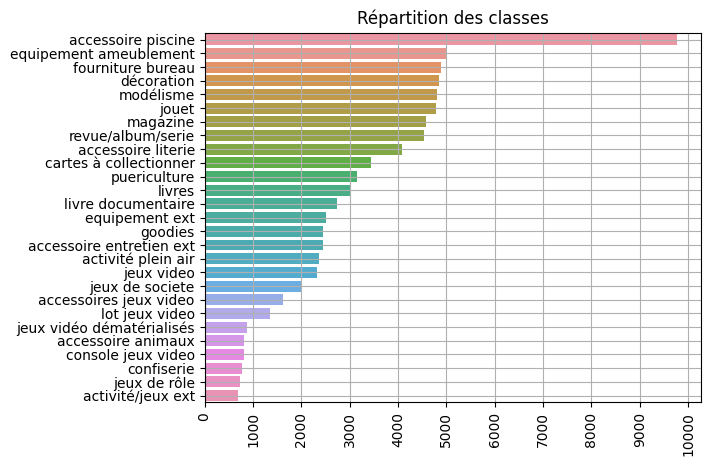

In [ ]:
sns.barplot(y=df['prdtypecode'].value_counts().index,x= df['prdtypecode'].value_counts().values );
plt.xticks([i for i in range(0,11000,1000)],rotation=90);
plt.grid()
plt.title("Répartition des classes");

>## Nombre de mots du texte initial

In [ ]:
df['texte_nb_mots'] = df['mots'].apply(lambda x : len(x))

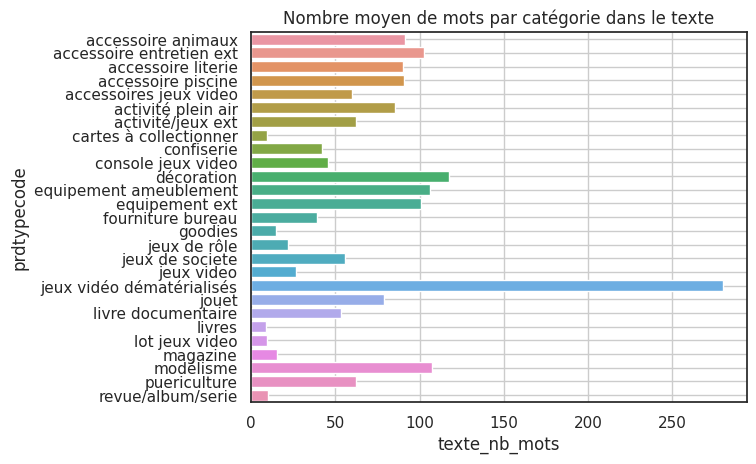

In [ ]:
sns.barplot(y=df.groupby(by='prdtypecode').agg({"texte_nb_mots":"mean"}).index, x=df.groupby(by='prdtypecode').agg({"texte_nb_mots":"mean"}).iloc[:,0])
plt.grid()
plt.title("Nombre moyen de mots par catégorie dans le texte");

### Représentation par Histogramme classique

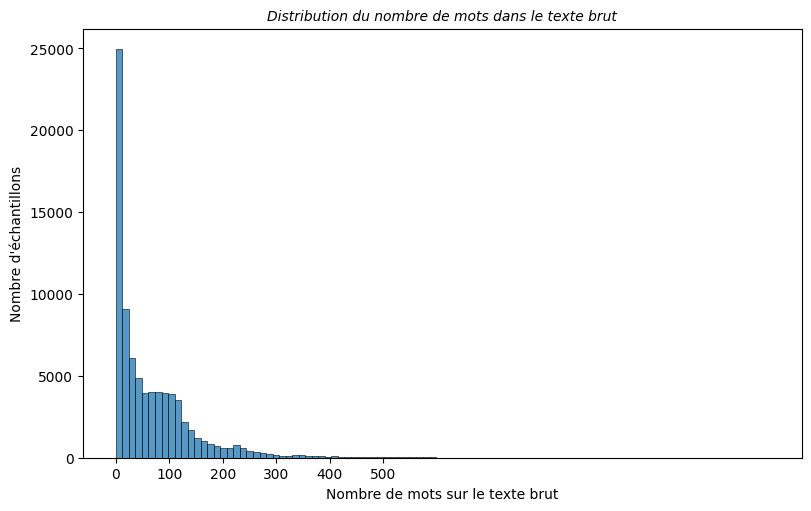

In [ ]:
# Représentation par Histogramme classique

# Création de la figure et des sous-graphiques
fig, ax = plt.subplots(figsize=(8, 5), layout='constrained')

# sns.histplot avec le nombre de mots
sns.histplot(df['texte_nb_mots'], bins=100, ax=ax)
ax.set_xlabel('Nombre de mots sur le texte brut')
ax.set_ylabel("Nombre d'échantillons")
ax.set_title('Distribution du nombre de mots dans le texte brut', loc='center', fontstyle='oblique', fontsize='medium')
ax.set_xticks([0,100,200,300,400,500])

# Affichage de la figure
plt.show()

### Représentation en Boxen Plot selon les classes

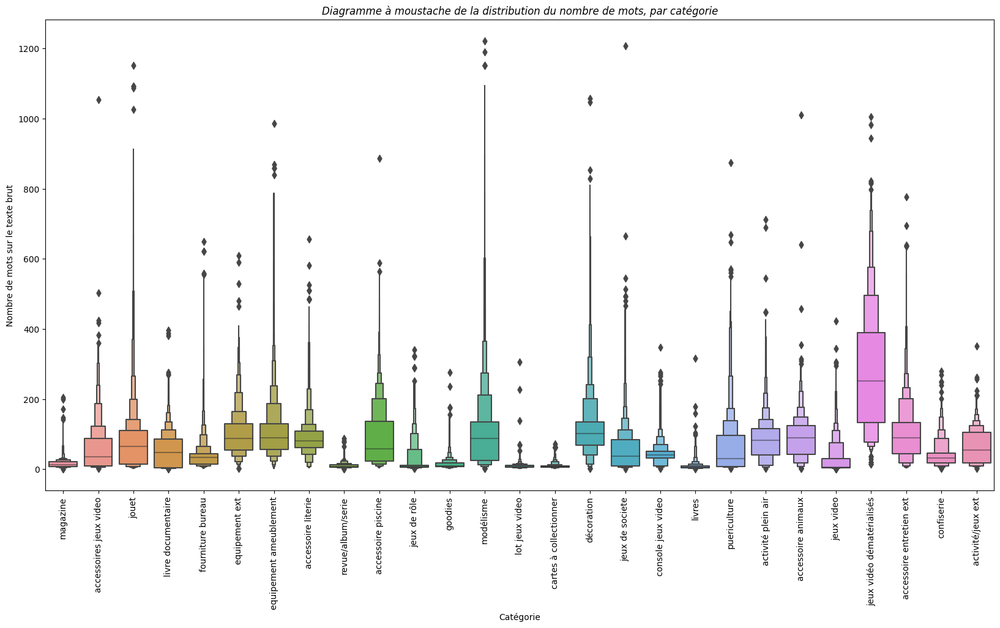

In [ ]:
# Création de la figure
fig, ax = plt.subplots(figsize=(20,10))

# Affichage du boxenplot
sns.boxenplot(data=df, x='prdtypecode', y='texte_nb_mots', ax=ax)

# Etiquettes
label = list(df['prdtypecode'].unique())
x = np.arange(len(label))

ax.set_xlabel('Catégorie')
ax.set_ylabel('Nombre de mots sur le texte brut')
ax.set_title('Diagramme à moustache de la distribution du nombre de mots, par catégorie', loc='center', fontstyle='oblique')
ax.set_xticks(x, df['prdtypecode'].unique(),rotation=90)

plt.show()

>## Nombre de valeurs chiffrées dans texte

In [ ]:
import re

def Nombre_regex_valeurs_chiffrees(liste):
  r = re.compile(r"[0-9]+")
  texte=""
  for i in liste:
    texte = texte + i
  return r.findall(texte)

df["texte_nombre"] = df["mots"].apply(lambda x: Nombre_regex_valeurs_chiffrees(x))
df["texte_n_nombre"] = df["texte_nombre"].apply(lambda x:len(x))


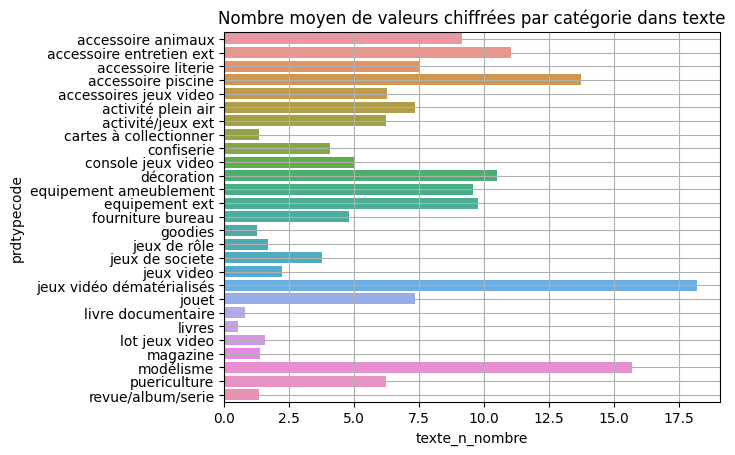

In [ ]:
sns.barplot(y=df.groupby(by='prdtypecode').agg({"texte_n_nombre":"mean"}).index, x=df.groupby(by='prdtypecode').agg({"texte_n_nombre":"mean"}).iloc[:,0])
plt.grid()
plt.title("Nombre moyen de valeurs chiffrées par catégorie dans texte");

>## Proportions valeurs chiffrées dans texte

In [ ]:
df["proportion_nombre"] = round(df["texte_n_nombre"]*100/df["texte_nb_mots"],2)

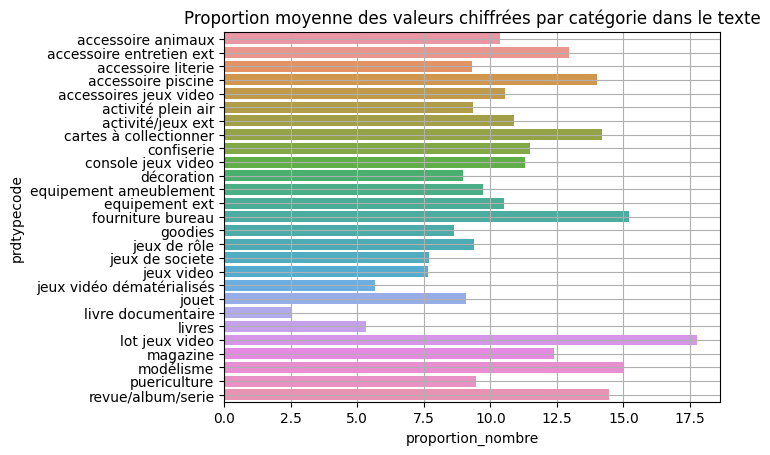

In [ ]:
sns.barplot(y=df.groupby(by='prdtypecode').agg({"proportion_nombre":"mean"}).index, x=df.groupby(by='prdtypecode').agg({"proportion_nombre":"mean"}).iloc[:,0])
plt.grid()
plt.title("Proportion moyenne des valeurs chiffrées par catégorie dans le texte");

>## Description vide

In [ ]:
crosstab = pd.crosstab(df['prdtypecode'],df["description_vide"],normalize='index')
crosstab_false = [crosstab.values[i][1] for i in range(len(crosstab.values))]
cross = pd.DataFrame(data={'col1': crosstab.index, 'col2': crosstab_false})
cross = cross.sort_values(by='col2')

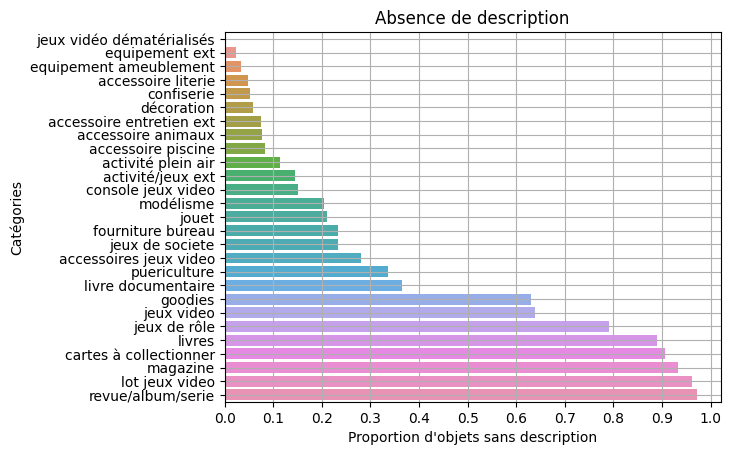

In [ ]:
sns.barplot(y=cross["col1"],x= cross['col2'] );
plt.xticks(np.arange(0, 1.1, step=0.1));
plt.xlabel("Proportion d'objets sans description")
plt.ylabel("Catégories")
plt.grid()
plt.title("Absence de description");

>## Nuage de mots

>>### Notre version

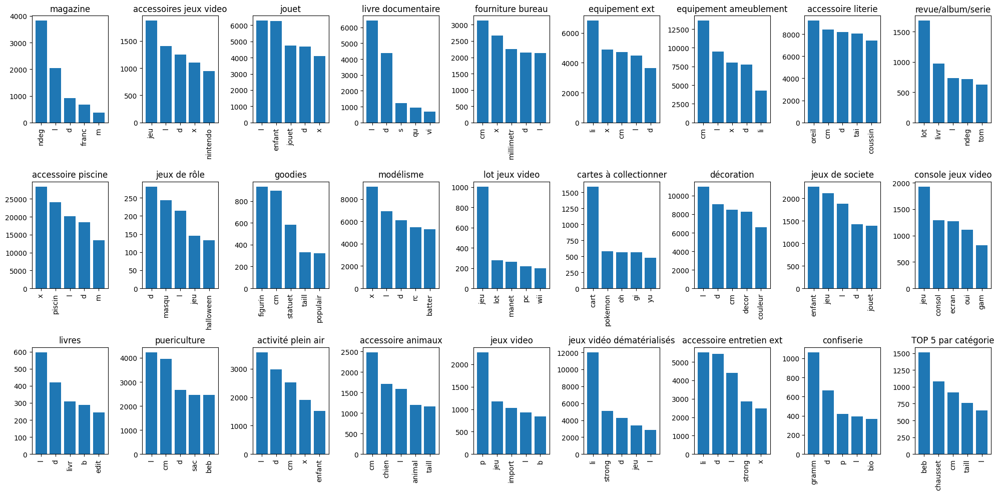

In [ ]:

fig, axs = plt.subplots(3, 9, figsize=(20, 10))
liste_valeurs = df['prdtypecode'].unique()
for i, valeur in enumerate(liste_valeurs):
    row = i // 9
    col = i % 9

    df_valeur = df.loc[df['prdtypecode'] == valeur]
    liste_mots = []
    for i in range(df_valeur.shape[0]):
        liste_mots.extend(df_valeur.iloc[i, 11])
    top_10_mots = FreqDist(liste_mots).most_common(5)

    mots = [mot for mot, _ in top_10_mots]
    frequences = [frequence for _, frequence in top_10_mots]

    axs[row, col].bar(mots,frequences)
    axs[row, col].set_title(f"{valeur}")
    axs[row, col].tick_params(axis='x', rotation=90)

plt.title("TOP 5 par catégorie")
plt.tight_layout()
plt.show()

>>### Version Nuages de mots

Imports

In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np

In [ ]:
# Text Mining
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline

#Sauvegarde
from joblib import dump,load

# Importer stopwords de la classe nltk.corpus
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

stop_words = set(stopwords.words('french'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Nuages de mots "à la main"

Exemple pour la classe 2583

# Nuage de mots sans retrait des mots vides

In [ ]:
# Création d'une colonne texte

def liste_en_texte(liste):
  texte=""
  for i in liste:
    texte = texte + i +" "
  return texte

df['texte'] = df['mots'].apply(lambda x : liste_en_texte(x))

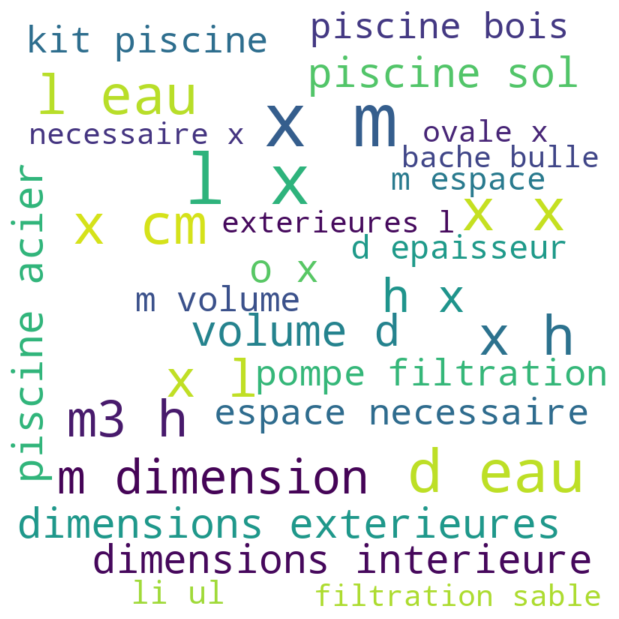

In [ ]:
# on concatene tous les mots de la categorie accessoires piscine
liste_piscine = df.loc[df.prdtypecode=="accessoire piscine","texte"]
liste_piscine = [w for w in liste_piscine if w==w]
text = ' '.join(liste_piscine)

#Calque du nuage de mots
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white', max_words=30,min_font_size = 10,max_font_size = 100).generate(text)

# On trace le nuage de mots
plt.figure(figsize = (8,6), facecolor = None)
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.savefig('wordcloud_piscine.png')
plt.show()

# Nuage de mots avec retrait des stopwords

In [ ]:
#Import et fonction spacy

!python -m spacy download fr_core_news_md

import spacy
nlp = spacy.load('fr_core_news_md')

stop_words = spacy.lang.fr.stop_words.STOP_WORDS

def stop_word_spacy(liste):
  stop_words = spacy.lang.fr.stop_words.STOP_WORDS
  tokens = [i for i in liste if i not in stop_words]
  return tokens



2023-08-24 18:25:08.747853: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-24 18:25:11.604581: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 MB 13.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('fr_core_news_md')


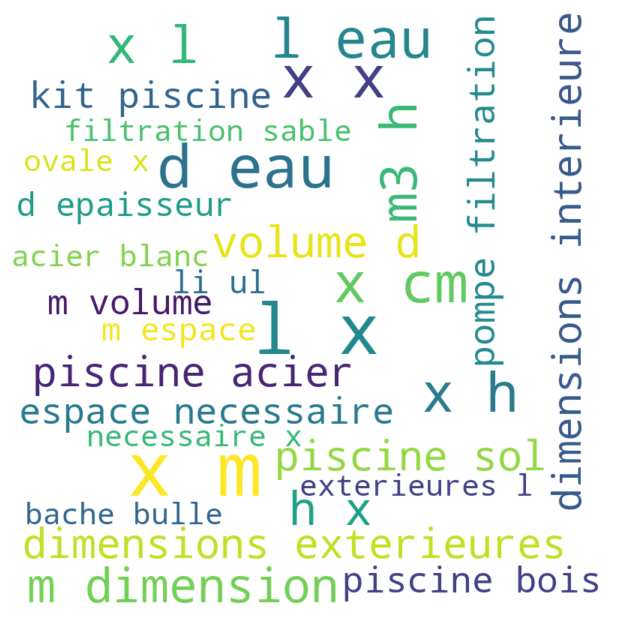

In [ ]:
# on concatene tous les mots de la categorie accessoires piscine
liste_piscine = df.loc[df.prdtypecode=="accessoire piscine","texte"]
liste_piscine = [w for w in liste_piscine if w==w]
text = ' '.join(liste_piscine)

#Calque du nuage de mots
stop_words = spacy.lang.fr.stop_words.STOP_WORDS
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white', stopwords=stop_words, max_words=30,min_font_size = 10,max_font_size = 100).generate(text)

# On trace le nuage de mots
plt.figure(figsize = (8,6), facecolor = None)
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.savefig('wordcloud_piscine.png')
plt.show()


# Nuage de mots avec retraits des caractères non alphanumérique, des mots vides et des mots de moins de 2 lettres A REFAIRE PLUS TARD

In [ ]:
text

'kit desinfection piscines enfants 20990  bouee gonflable river tube oogarden bouee gonflable river tube pvc ideale parties glissade l eau dimensions article gonfle 107 x 107 x 30 cmdimensions article plat 122 cmmatiere pvcinclus corde maintienconfortablement installe accrochez bouee gonflable river tube jeux glisse piscine mer  testeur electronique ph utilisation testeur electronique phgrace testeur electronique ph strong lecture instantanee valeur s affiche besoin d interpreter testeur sensibilise l importance ph bon equilibre l eau caracteristiques techniques testeur electronique ph affichage numerique li alimentation 2 piles r9 li garantie 1 an li solution tampon fournie pouvoir recalibrer l appareil apres dizaine d utilisation garantissant resultat fiable li  pompe filtration speck badu 95  astralcom 1 cv mono dab surpresseur piscine tension v monophase 230 v puissance 1 cv turbine nombre 4 compatible traitement sel oui  lot 8 prefiltres jetables panier skimmer marina lots 8 pre f

In [ ]:
liste_piscine = df.loc[df.prdtypecode=="accessoire piscine","texte"]
liste_piscine = [w for w in liste_piscine if w==w]
text = ' '.join(liste_piscine)

liste_mots = [mots for mots in text if (mots.isalnum() and mots not in stop_word_spacy and len(mots)>1)]
chaine = ' '.join(i.lower() for i in liste_mots)

#Calque du nuage de mots
stop_words = spacy.lang.fr.stop_words.STOP_WORDS
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white', max_words=30,min_font_size = 10,max_font_size = 100).generate(chaine)

# On trace le nuage de mots
plt.figure(figsize = (8,6), facecolor = None)
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)
plt.savefig('wordcloud_piscine.png')
plt.show()


TypeError: ignored

## Nuages de mots automatisé

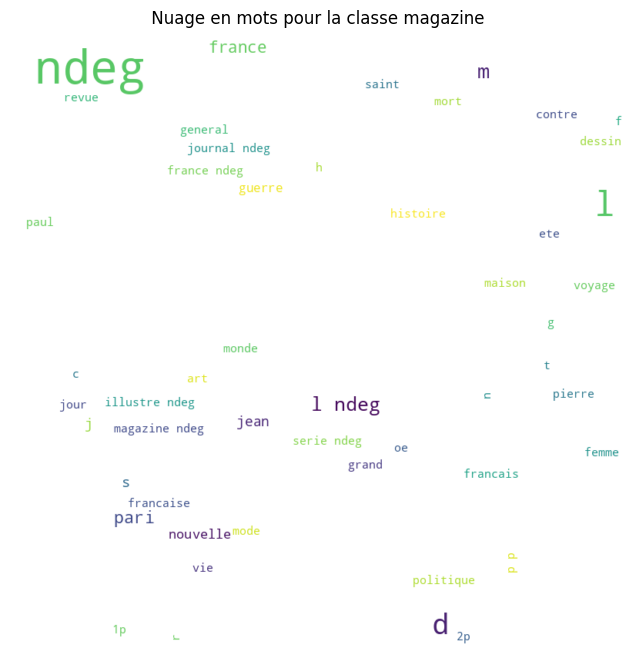

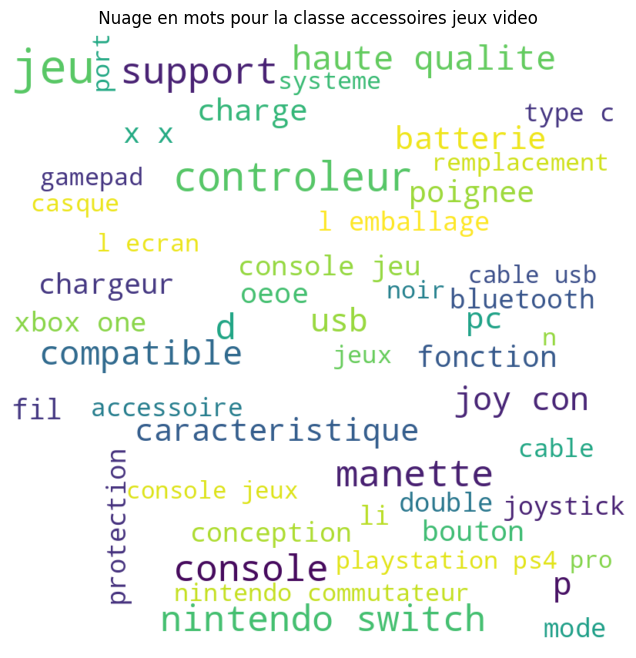

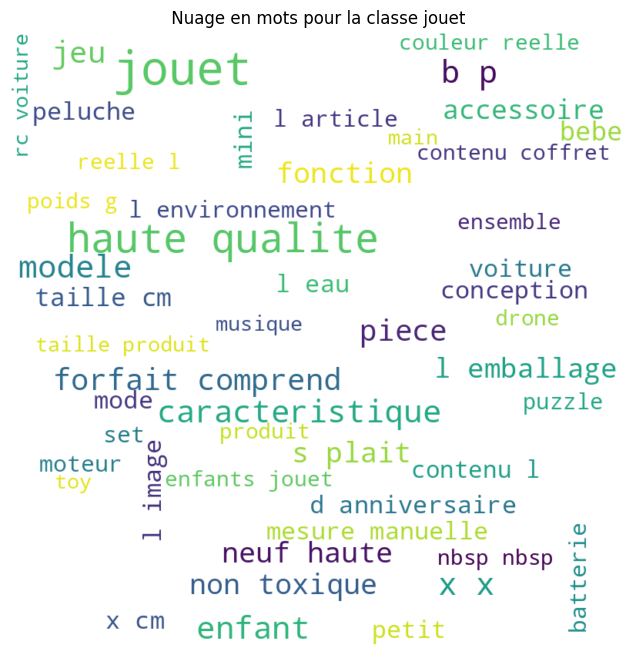

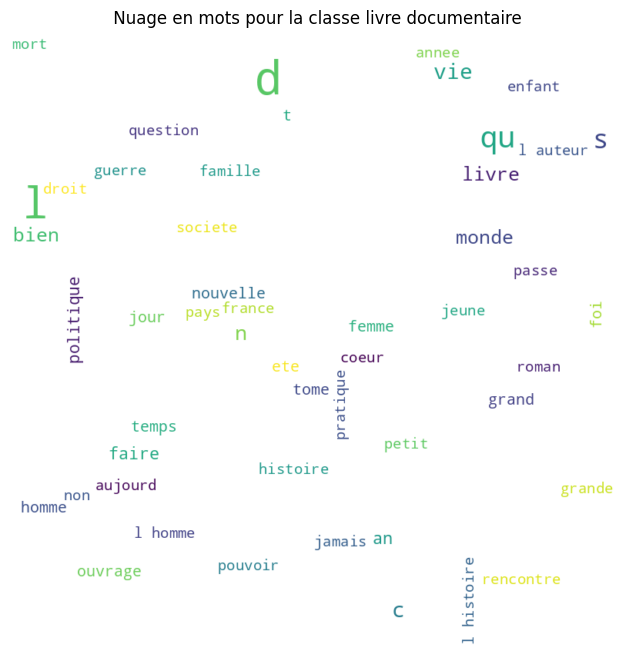

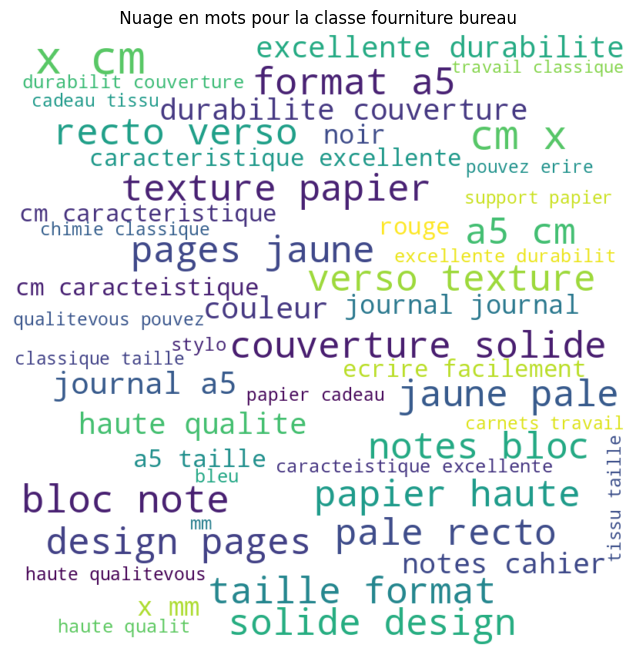

...

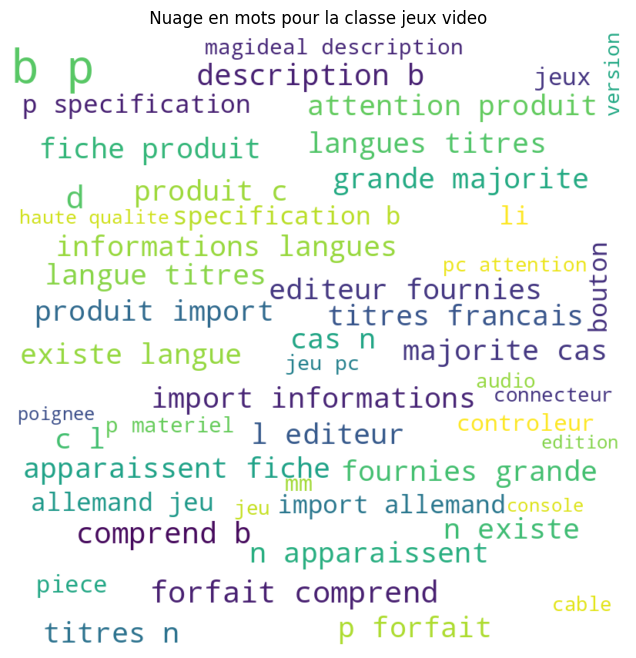

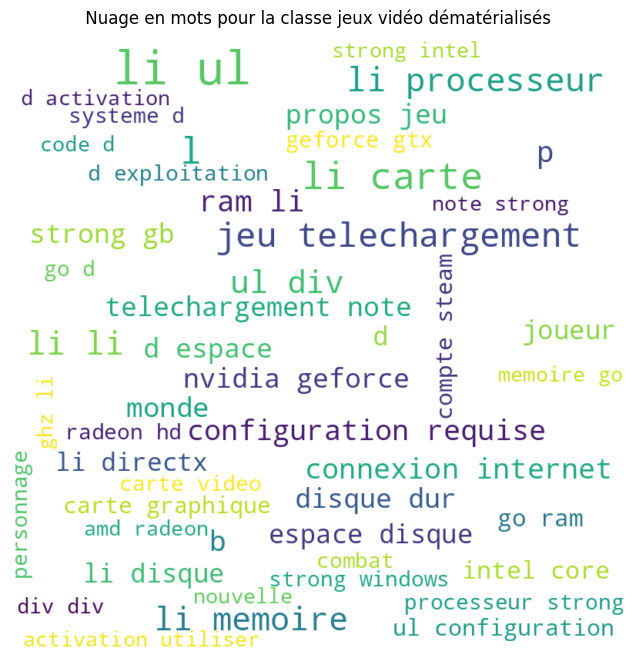

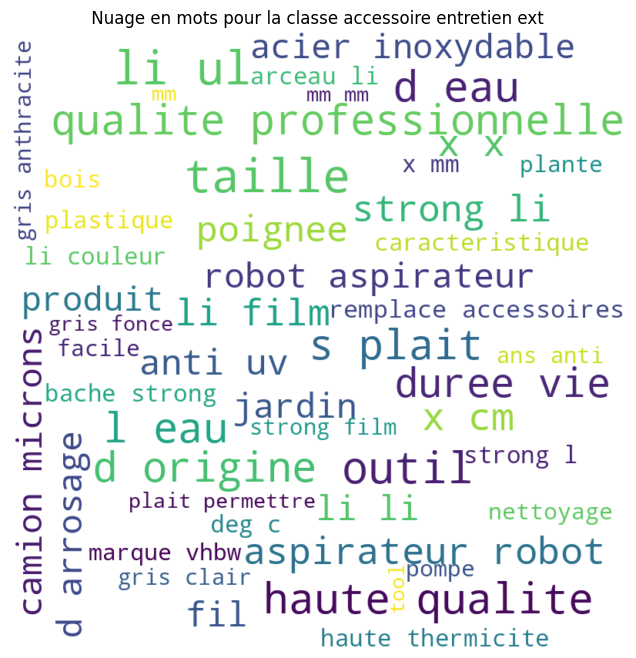

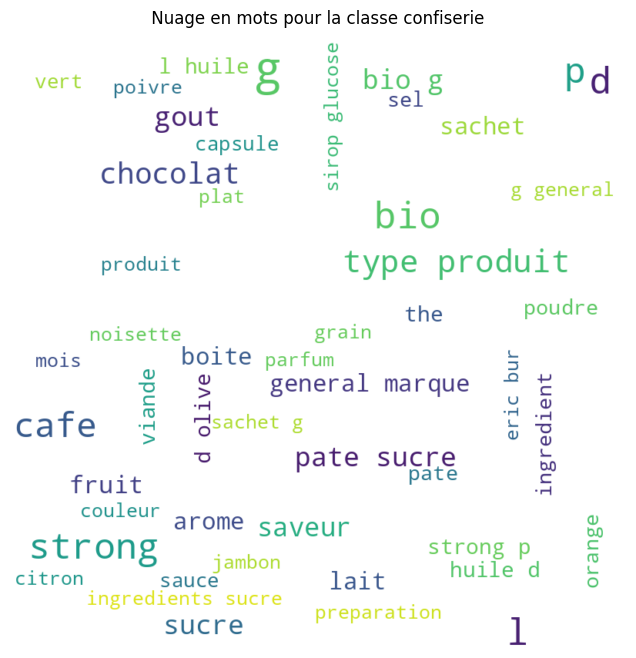

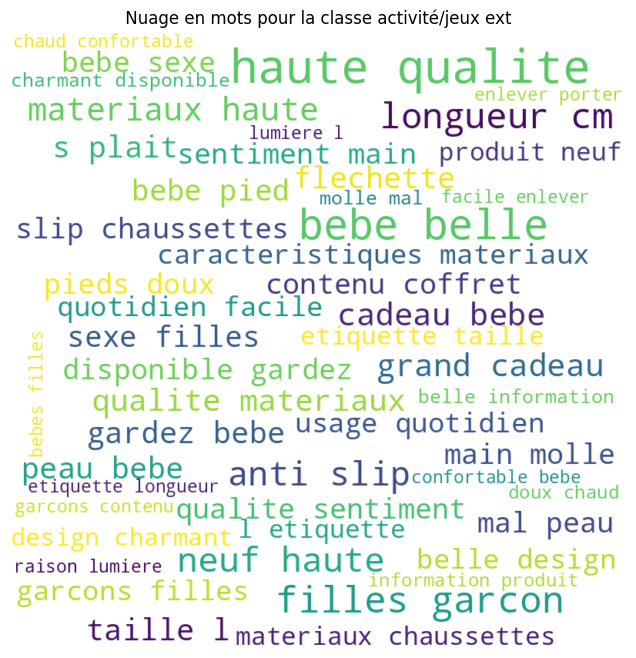

In [ ]:
for i in df['prdtypecode'].unique():
    df_temp= df[df['prdtypecode'] == i]
    words = df_temp['mots'].apply(lambda x: ' '.join(x))
    words= pd.DataFrame(words)

    text =" "
    for j in range(len(words)):
        text = words.iloc[j,0] + text

    print("\n")
    print("\n")
    plt.figure(figsize= (12,8))
    wc = WordCloud(background_color="white",width=800, stopwords=stop_words, height=800, max_words=50,max_font_size=60, min_font_size = 10, random_state=42).generate(text)
    plt.title(f" Nuage en mots pour la classe {i} ")
    plt.axis('off')
    plt.imshow(wc,interpolation='bilinear') # Affichage
    plt.savefig('wordcloud.png')
    plt.show()

In [ ]:
# Mots vides présents dans les nuages de mots
Liste_pour_ajout_stopwords :['ce', 'faire','plus','tout','être','celui','san', 'alors', 'aussi','comme', 'avoir', 'boi', 'amp' , 'sous', 'nbsp', 'chaque', 'tous', 'oui', 'non', 'jusqu', 'sou', 'bel']


Autre comptage et représentation graphique

In [ ]:
from collections import Counter
df.head()


,productid,imageid,prdtypecode,description_vide,langue_texte,mots,mots_stem,mots_stem_sans_chiffres,mots_lem,mots_lem_sans_chiffres,mots_lem_stem,mots_lem_stem_sans_chiffres,texte_nb_mots,texte_nombre,texte_n_nombre,proportion_nombre,texte
1,436067568,1008141237,magazine,True,fr,"[journal, arts, ndeg, 133, 28, 09, 2001, l, ar...","[journal, art, ndeg, 133, 28, 09, 2001, l, art...","[journal, art, ndeg, l, art, march, salon, d, ...","[journal, art, ndeg, 133, 28, 09, 2001, l, art...","[journal, art, ndeg, l, art, marche, salon, d,...","[journal, art, ndeg, 133, 28, 09, 2001, l, art...","[journal, art, ndeg, l, art, march, salon, d, ...",26,[13328092001],1,3.85,journal arts ndeg 133 28 09 2001 l art marche ...
2,201115110,938777978,accessoires jeux video,False,fr,"[grand, stylet, ergonomique, bleu, gamepad, ni...","[grand, stylet, ergonom, bleu, gamepad, ninten...","[grand, stylet, ergonom, bleu, gamepad, ninten...","[grand, stylet, ergonomique, bleu, gamepad, ni...","[grand, stylet, ergonomique, bleu, gamepad, ni...","[grand, stylet, ergonom, bleu, gamepad, ninten...","[grand, stylet, ergonom, bleu, gamepad, ninten...",86,"[1, 3468]",2,2.33,grand stylet ergonomique bleu gamepad nintendo...
3,50418756,457047496,jouet,True,fr,"[peluche, donald, europe, disneyland, 2000, ma...","[peluch, donald, europ, disneyland, 2000, mari...","[peluch, donald, europ, disneyland, marionnet,...","[peluche, donald, europe, disneyland, 2000, ma...","[peluche, donald, europe, disneyland, marionne...","[peluch, donald, europ, disneyland, 2000, mari...","[peluch, donald, europ, disneyland, marionnet,...",7,[2000],1,14.29,peluche donald europe disneyland 2000 marionne...
4,278535884,1077757786,livre documentaire,False,fr,"[guerre, tuques, luc, idees, grandeur, veut, o...","[guerr, tuqu, luc, ide, grandeur, veut, organi...","[guerr, tuqu, luc, ide, grandeur, veut, organi...","[guerre, tuque, luc, idees, grandeur, vouloir,...","[guerre, tuque, luc, idees, grandeur, vouloir,...","[guerr, tuqu, luc, ide, grandeur, vouloir, org...","[guerr, tuqu, luc, ide, grandeur, vouloir, org...",20,[],0,0.00,guerre tuques luc idees grandeur veut organise...
5,5862738,393356830,magazine,True,fr,"[afrique, contemporaine, ndeg, 212, hiver, 200...","[afriqu, contemporain, ndeg, 212, hiv, 2004, d...","[afriqu, contemporain, ndeg, hiv, dossi, japon...","[afrique, contemporain, ndeg, 212, hiver, 2004...","[afrique, contemporain, ndeg, hiver, dossier, ...","[afriqu, contemporain, ndeg, 212, hiv, 2004, d...","[afriqu, contemporain, ndeg, hiv, dossi, japon...",9,"[212, 2004]",2,22.22,afrique contemporaine ndeg 212 hiver 2004 doss...


In [ ]:
valeur = '2583'
df_valeur = df.loc[df["prdtypecode"] == valeur]
liste_mots = []
for i in range(df_valeur.shape[0]):
  liste_mots.extend(df_valeur.iloc[i,5])

liste_mots = [mots for mots in liste_mots if (mots.isalnum() and mots not in stop_words) and len(mots)>1]
chaine = ' '.join(i.lower() for i in liste_mots)
dico = Counter(chaine.split())
mots = [m[0] for m in dico.most_common(15)]
freq = [m[1] for m in dico.most_common(15)]
print(mots)
print(freq)

[]
[]


In [ ]:
fig = go.Figure()

plt.figure(figsize=[20,20])

fig.add_traces(go.Scatter(y = freq , x = mots , name= f'Les 15 mots les plus fréquents pour la catégorie {valeur}'))

fig.update_layout(showlegend = True, legend_title = 'Classe')

fig.update_layout(title='Nombre de mots pour les 15 mots les plus fréquents sans les mots vides',  # titre
                   xaxis_title='Les 15 mots les plus fréquents',   # x label
                   yaxis_title='Nombre de mots')

fig.show()


<Figure size 2000x2000 with 0 Axes>

## Regex

>>### Date

In [ ]:
r = re.compile(r"[0-9]{2}[\-/]+[0-9]{2}[\-/]+[0-9]{2,4}")


df["texte_date"] = df["texte"].apply(lambda x: r.findall(x))
df["texte_n_date"] = df["texte_date"].apply(lambda x:len(x))
df["presence_date"] = df["texte_n_date"].apply(lambda x: True if x!=0 else False)

In [ ]:
crosstab = pd.crosstab(df['prdtypecode'],df["presence_date"],normalize='index')
crosstab_false = [crosstab.values[i][1] for i in range(len(crosstab.values))]
cross = pd.DataFrame(data={'col1': crosstab.index, 'col2': crosstab_false})
cross = cross.sort_values(by='col2')

In [ ]:
sns.barplot(y=cross["col1"],x= cross['col2'] );
plt.xticks(np.arange(0, 1.1, step=0.1));
plt.xlabel("Proportion d'objets avec date")
plt.ylabel("Catégories")
plt.grid()
plt.title("Présence de date");

In [ ]:
df.head()

# Analyse de l'apport des opérations de trasnformation successives à l'aide d'un matrice document * termes

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import word_tokenize

# charger un vectorizer
vect0 = CountVectorizer(lowercase=True)
# creer la matrice documents x termes à l'aide du vectorizer
dtm0 = vect0.fit_transform(df["mots"].apply(lambda s:str(s)))

# charger un vectorizer
vect_stem = CountVectorizer(lowercase=True)
# creer la matrice documents x termes à l'aide du vectorizer
dtm1 = vect_stem.fit_transform(df["mots_stem"].apply(lambda s:str(s)))


# charger un vectorizer
vect_stem_sans_chiffres = CountVectorizer(lowercase=True)
# creer la matrice documents x termes à l'aide du vectorizer
dtm2 = vect_stem_sans_chiffres.fit_transform(df["mots_stem_sans_chiffres"].apply(lambda s:str(s)))

# charger un vectorizer
vect_lem = CountVectorizer(lowercase=True)
# creer la matrice documents x termes à l'aide du vectorizer
dtm3 = vect_lem.fit_transform(df["mots_lem"].apply(lambda s:str(s)))

In [ ]:
# charger un vectorizer
vect_lem_sans_chiffres = CountVectorizer(lowercase=True)
# creer la matrice documents x termes à l'aide du vectorizer
dtm4 = vect_lem_sans_chiffres.fit_transform(df["mots_lem_sans_chiffres"].apply(lambda s:str(s)))

# charger un vectorizer
vects_lem_stem = CountVectorizer(lowercase=True)
# creer la matrice documents x termes à l'aide du vectorizer
dtm5 = vects_lem_stem.fit_transform(df["mots_lem_stem"].apply(lambda s:str(s)))

# charger un vectorizer
vect_lem_stem_sans_chiffres = CountVectorizer(lowercase=True)
# creer la matrice documents x termes à l'aide du vectorizer
dtm6 = vect_lem_stem_sans_chiffres.fit_transform(df["mots_lem_stem_sans_chiffres"].apply(lambda s:str(s)))


In [ ]:

print(dtm0.shape)
print(dtm1.shape)
print(dtm2.shape)
print(dtm3.shape)
print(dtm4.shape)
print(dtm5.shape)
print(dtm6.shape)

(81426, 152193)
(81426, 122578)
(81426, 113213)
(81426, 139885)
(81426, 130515)
(81426, 121810)
(81426, 112437)


In [ ]:
liste_dimensions_matrice_termes =[dtm0.shape,dtm1.shape,dtm2.shape,dtm3.shape,dtm4.shape,dtm5.shape,dtm6.shape]

liste_nb_termes =[]
for i in range(7):
  liste_nb_termes.append(liste_dimensions_matrice_termes[i][1])
liste_nb_termes

[152193, 122578, 113213, 139885, 130515, 121810, 112437]

In [ ]:
import plotly.express as px

fig = go.Figure()

plt.figure(figsize=[20,20])

fig = px.bar(x = liste_nb_termes, y = df.columns[5:12], text = liste_nb_termes,orientation = 'h')

fig.update_layout(showlegend = True, legend_title = 'Nombre des mots de matrices documents termes')

fig.update_layout(title='nombre de termes de la matrice document*termes',  # titre
                   xaxis_title='nombre de termes vectorisés',   # x label
                   yaxis_title= 'colonne' 'nombre de termes vectorisés',barmode='overlay')

fig.show()



<Figure size 2000x2000 with 0 Axes>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
sns.set(style="white", palette="muted", color_codes=True)

f, axes = plt.subplots(4, 2, figsize=(8, 7), sharex=True)
sns.despine(left=True)

sns.displot(list(dtm0.toarray().sum(axis=1)),ax=axes[0],axlabel="0. donnees brutes")

sns.displot(list(dtm1.toarray().sum(axis=1)),ax=axes[1],axlabel="1. avec stemmatisation")

sns.displot(list(dtm3.toarray().sum(axis=1)),ax=axes[3],axlabel="3. avec stemmatisation sans les chiffres")

sns.displot(list(dtm4.toarray().sum(axis=1)),ax=axes[4],axlabel="4. avec lemmatisation")

sns.displot(list(dtm5.toarray().sum(axis=1)),ax=axes[5],axlabel="5. avec lemmatisation sans les chiffres")

sns.displot(list(dtm6.toarray().sum(axis=1)),ax=axes[6],axlabel="6. avec lemmatisation stemmatisation ")

sns.displot(list(dtm7.toarray().sum(axis=1)),ax=axes[7],axlabel="7. avec lemmatisation stemmatisation ans les chiffres")

plt.suptitle("Nombre de mots par documents")

NameError: ignored